In [1]:
import numpy as np
import jax.numpy as jnp
import matplotlib.pyplot as plt
import pandas as pd
import corner, glob, dill

In [2]:
import seaborn as sns
sns.set(style='ticks', font_scale=1.6, font='times')
plt.rcParams["figure.figsize"] = (12,6)
from matplotlib import rc
rc('text', usetex=True)

In [3]:
def combine_samples(postfiles, chainidx):
    elements, masses, models = None, None, None
    for post in postfiles:
        print (post)
        s = dill.load(open(post, 'rb')).get_samples()
        if elements is None:
            elements, masses, models = s['elements'], s['mass'], s['tcmodel']
        else:
            elements = np.concatenate((elements, s['elements']), axis=0)
            masses = np.concatenate((masses, s['mass']), axis=0)
            models = np.concatenate((models, s['tcmodel']), axis=0)
    eccs = np.sqrt(elements[:,:,1]**2 + elements[:,:,2]**2)
    return elements, masses, eccs, models

## JWST only

In [4]:
period_j = 2.
#period_j = 3.
#period_j = 4.

postfiles, output, chainidx = \
    list(np.sort(glob.glob("../ttvfit_4pl/%dto%d*.pkl"%(period_j,period_j-1)))), \
    "%dto%d_merged_"%(period_j,period_j-1), np.arange(4)

In [5]:
elements, masses, eccs, tcmodels = combine_samples(postfiles, chainidx)

../ttvfit_4pl/2to1_dt1.8_nw500_ns500_c4_mcmc.pkl
../ttvfit_4pl/2to1_dt1.8_nw500_ns500_c4_mcmc02.pkl
../ttvfit_4pl/2to1_dt1.8_nw500_ns500_c4_mcmc03.pkl
../ttvfit_4pl/2to1_dt1.8_nw500_ns500_c4_mcmc04.pkl


In [21]:
np.shape(masses[:,j])
#np.shape(elements[:,j,eidx])

(8000,)

In [33]:
eidx = [0,1,2,5]
arr = np.hstack([np.concatenate([masses[:,j][:,None]/3.003e-6, elements[:,j,eidx]], axis=1) for j in range(4)])
labels = np.hstack([['mass%d'%j, 'period%d'%j, 'ecosw%d'%j, 'esinw%d'%j, 'T%d'%j] for j in range(1,5)])

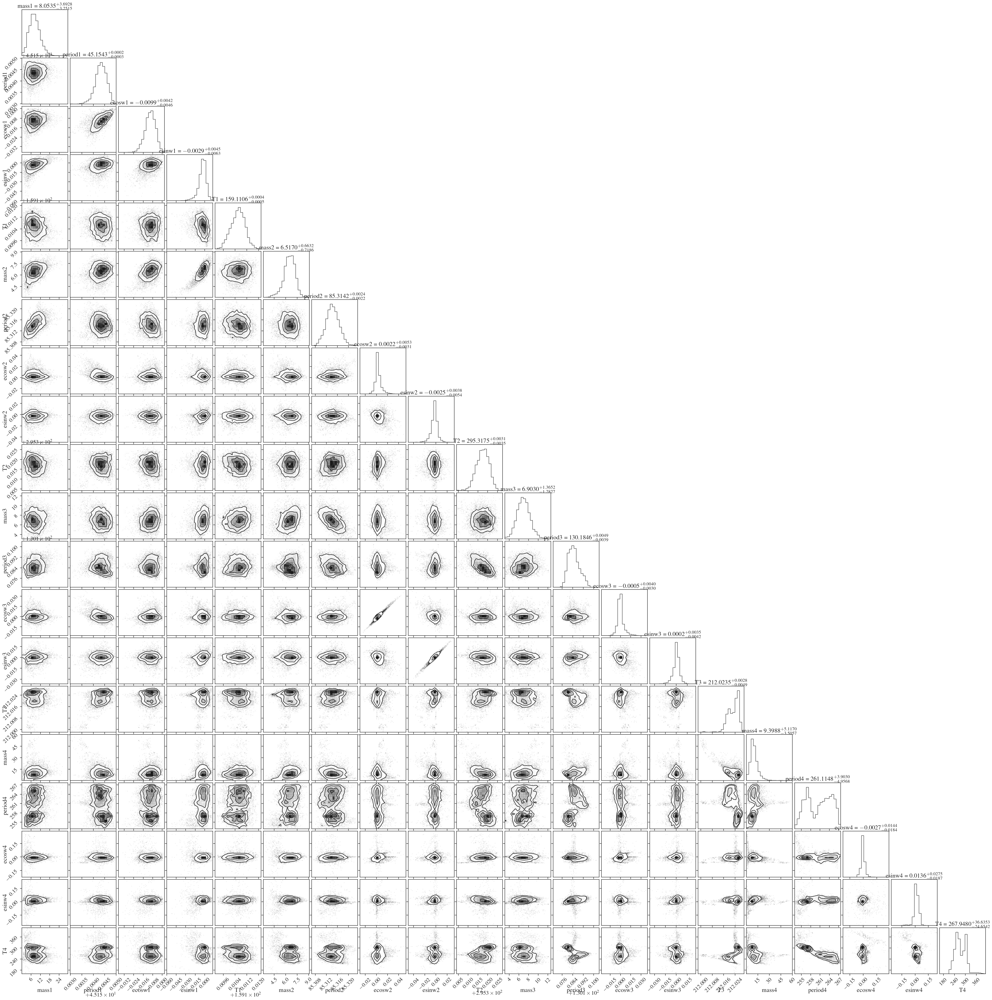

In [34]:
fig = corner.corner(arr, labels=labels, show_titles=True, title_fmt='.4f')
plt.savefig("jwstonly_2to1.png", dpi=200, bbox_inches="tight")

## Comparison with preliminary ground-based data

In [42]:
postfiles2 = glob.glob("../ttvfit_hmc/*mcmc*.pkl")
elements2, masses2, eccs2, tcmodels2 = combine_samples(postfiles2, np.arange(4))

../ttvfit_hmc/gridjg_dt1.8_nw500_ns500_c4_mcmc02.pkl
../ttvfit_hmc/gridjg_dt1.8_nw500_ns500_c4_mcmc03.pkl
../ttvfit_hmc/gridjg_dt1.8_nw500_ns500_c4_mcmc04.pkl
../ttvfit_hmc/gridjg_dt1.8_nw500_ns500_c4_mcmc.pkl


In [26]:
np.shape(elements)

(8000, 4, 6)

In [116]:
eidx = [0,1,2,5]
arr = np.c_[masses[:,2], elements[:,0,eidx], elements[:,1,eidx], elements[:,2,eidx], elements[:,3,eidx]]
arr2 = np.c_[masses2[:,2], elements2[:,0,eidx], elements2[:,1,eidx], elements2[:,2,eidx], elements2[:,3,eidx]]

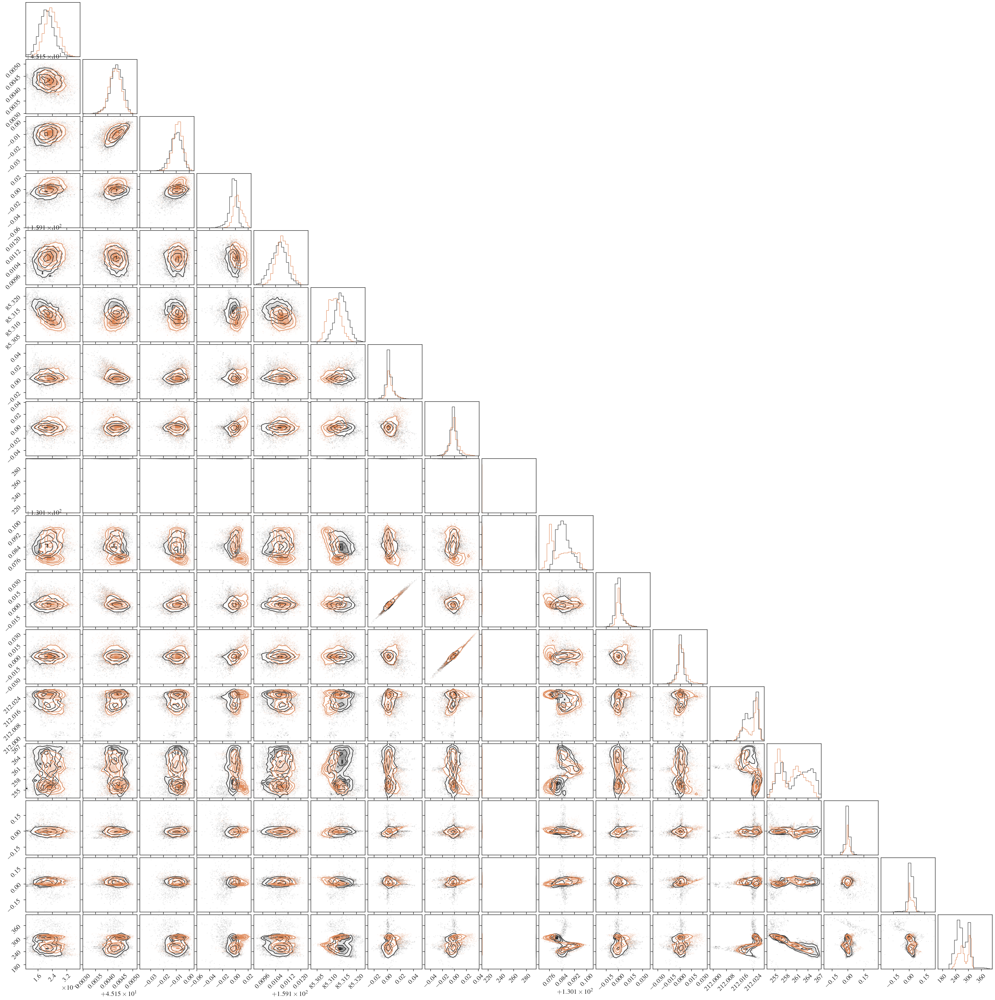

In [117]:
fig_ = corner.corner(arr)
fig = corner.corner(arr2, fig=fig_, color='C1')

In [122]:
edix = [0,5]
labs = ["$m_%d$"%(i+1) for i in range(4)] + ["$e_%d$"%(i+1) for i in range(4)] + ['$P_4$', '$T_4$']#'$e_4\cos\omega_4$', '$e_4\sin\omega_4$', '$T_4$']

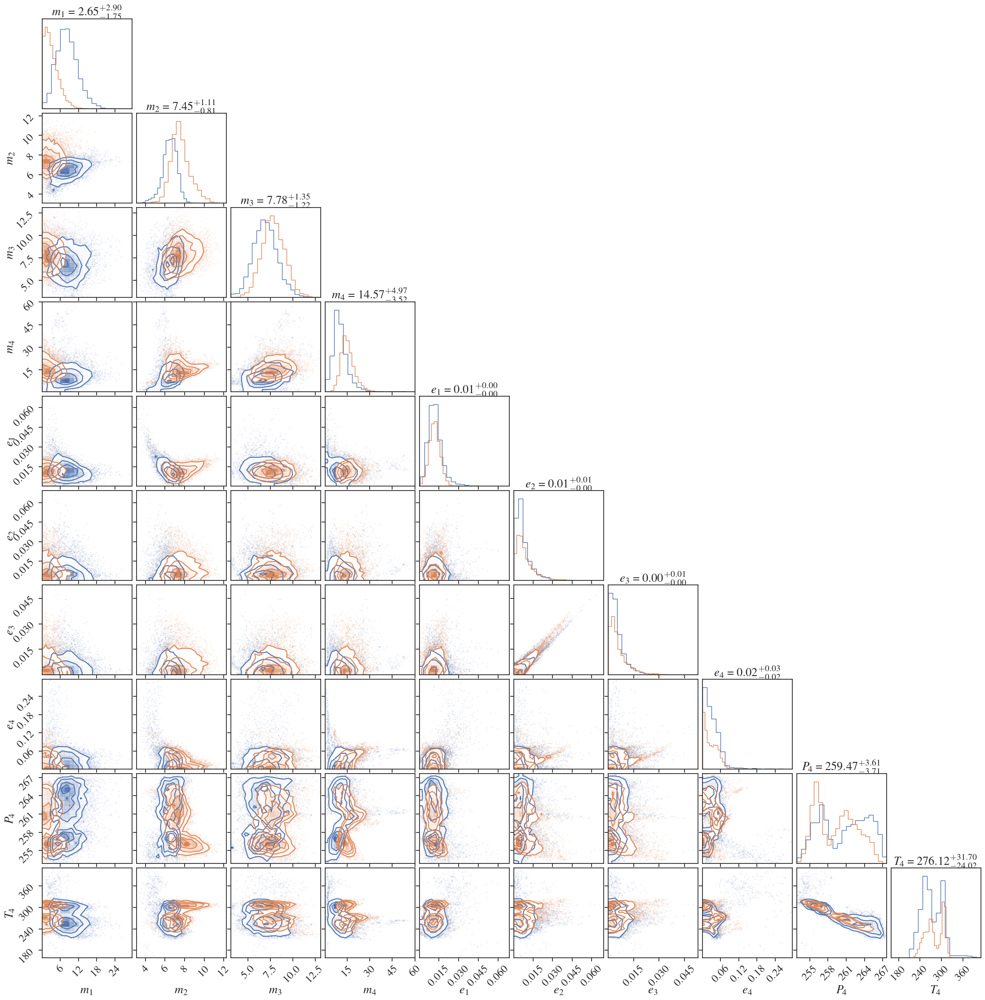

In [124]:
# orange: with ground, blue: JWST only
edix = [0,5]
eeidx = 1 #elements[:,1,eeidx]
fig1 = corner.corner(np.c_[masses/3.003e-6, eccs, elements[:,3,edix]], color='C0', labels=labs, show_titles=True)
fig = corner.corner((np.c_[masses2/3.003e-6, eccs2, elements2[:,3,edix]]), fig=fig1, color='C1', 
                    labels=labs, show_titles=True)
plt.savefig("comparison_mass_ecc.png", dpi=200, bbox_inches="tight")